In [1]:
import time
import copy
import numpy as np
import pandas as pd
import seaborn as sn
from tqdm import tqdm
import matplotlib.pyplot as plt

import sklearn
from sklearn.manifold import TSNE

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Function

from models import *
from utils import *
from datasets import *

In [2]:
from rpy2.rinterface_lib.callbacks import logger as rpy2_logger
import logging
rpy2_logger.setLevel(logging.ERROR)   # will display errors, but not warnings

# dataset

In [38]:
import torchvision as tv
import torchvision.transforms as transforms
from torch.autograd import Variable
from torchvision.utils import save_image

# Data Preprocessing

transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
trainTransform  = tv.transforms.Compose([tv.transforms.ToTensor(), tv.transforms.Normalize((0.1307,), (0.3081,))])
trainset = tv.datasets.MNIST(root='./data',  train=True, download=False, transform=transform)
testset = tv.datasets.MNIST(root='./data',  train=False, download=False, transform=transform)

# x = trainset[0][0].reshape(28,28)
# x.shape

# sample
idx = np.random.choice(np.arange(len(trainset)), size=1000)
trainset = [trainset[i] for i in idx]
idx = np.random.choice(np.arange(len(testset)), size=1000)
testset = [testset[i] for i in idx]

traindata = [i[0].unsqueeze(0) for i in trainset]
trainlabel = [i[1] for i in trainset]
testdata = [i[0].unsqueeze(0) for i in testset]
testlabel = [i[1] for i in testset]

X_train = torch.vstack(traindata)
y_train = torch.tensor(trainlabel)
X_test = torch.vstack(testdata)
y_test = torch.tensor(testlabel)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

(torch.Size([1000, 1, 28, 28]),
 torch.Size([1000, 1, 28, 28]),
 torch.Size([1000]),
 torch.Size([1000]))

In [39]:
batch_size = 1000 # 1024

# construct graph of nearest neighbors
graph_constructor_train =  ConstructUMAPGraph(metric='euclidean', n_neighbors=15, batch_size=1000, random_state=42)
epochs_per_sample_train, head_train, tail_train, weight_train = graph_constructor_train(X_train)

graph_constructor_test =  ConstructUMAPGraph(metric='euclidean', n_neighbors=15, batch_size=1000, random_state=42)
epochs_per_sample_test, head_test, tail_test, weight_test = graph_constructor_test(X_test)

Thu Nov 30 20:45:45 2023 Building RP forest with 7 trees
Thu Nov 30 20:45:45 2023 NN descent for 10 iterations
	 1  /  10
	 2  /  10
	 3  /  10
	 4  /  10
	Stopping threshold met -- exiting after 4 iterations
Thu Nov 30 20:45:45 2023 Building RP forest with 7 trees
Thu Nov 30 20:45:45 2023 NN descent for 10 iterations
	 1  /  10
	 2  /  10
	 3  /  10
	 4  /  10
	Stopping threshold met -- exiting after 4 iterations


In [5]:
# num_edges = len(edges_from_exp)
# batch_size = 1024

# batches_per_epoch = int(num_edges / batch_size / 5)
# batches_per_epoch

In [6]:
# rand_index = np.random.randint(0, len(edges_to_exp) - 1, size=batch_size)
# rand_index, len(rand_index)

In [7]:
# batch_index_to = edges_to_exp[rand_index]
# batch_index_to, len(batch_index_to)

In [8]:
# batch_index_from = edges_from_exp[rand_index]
# batch_index_from, len(batch_index_from)

In [9]:
# batch_to = torch.Tensor(X[batch_index_to])
# print(batch_to.shape, len(batch_to))

# batch_from = torch.Tensor(X[batch_index_from])
# print(batch_from.shape, len(batch_from))

In [40]:
# plot examples of nearest neighbors
fig, ax = plt.subplots(2,3,figsize=(12,4))
ids = np.random.randint(0, len(X_train), size=3)
for j in range(3):
    ax[0][j].imshow(X_train[head_train[ids[j]],0,:,:])
    ax[1][j].imshow(X_train[tail_train[ids[j]],0,:,:])

In [41]:
train_dataset = UMAPDataset(
    data=X_train, labels=y_train, 
    epochs_per_sample=epochs_per_sample_train, head=head_train, tail=tail_train, weight=weight_train, 
    device='cuda', batch_size=batch_size, feedback=None
)
test_dataset = UMAPDataset(
    data=X_test, labels=y_test, 
    epochs_per_sample=epochs_per_sample_test, head=head_test, tail=tail_test, weight=weight_test, 
    device='cuda', batch_size=batch_size, feedback=None
)

criterion = UMAPLoss(device='cuda', min_dist=0.1, batch_size=batch_size, negative_sample_rate=5, edge_weight=None, repulsion_strength=1.0)

# UMAP + AE

In [49]:
class AutoEncoder(nn.Module):

    def __init__(self, hidden_dim=2):
        super().__init__()
        
        # encoder
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, stride=2)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2)
        self.flatten = nn.Flatten()
        self.linear1 = nn.Linear(128*6*6, 512)
        self.linear2 = nn.Linear(512, 512)
        self.linear3 = nn.Linear(512, hidden_dim)

        # decoder
        self.de_linear3 = nn.Linear(hidden_dim, 512)
        self.de_linear2 = nn.Linear(512, 512)
        self.de_linear1 = nn.Linear(512, 128*6*6)
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(128, 6, 6))
        self.de_conv2 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2)
        self.de_conv1 = nn.ConvTranspose2d(64, 1, kernel_size=3, stride=2, output_padding=1)

    def forward(self, x):
        # encoder
        # print("x: ", x.shape)
        x = F.relu(self.conv1(x))
        # print("x: ", x.shape)
        x = F.relu(self.conv2(x))
        # print("x: ", x.shape)
        x = self.flatten(x)
        x = F.relu(self.linear1(x))
        x = F.relu(self.linear2(x))
        z = F.relu(self.linear3(x))

        # decoder
        x = F.relu(self.de_linear3(z))
        x = F.relu(self.de_linear2(x))
        x = F.relu(self.de_linear1(x))
        x = self.unflatten(x)
        # print("x: ", x.shape)
        x = F.relu(self.de_conv2(x))
        # print("x: ", x.shape)
        x = F.relu(self.de_conv1(x))
        # print("x: ", x.shape)
        
        return z, x

In [55]:
model = AutoEncoder().cuda()

x = torch.ones((1000, 1, 28, 28)).cuda()
z, x = model(x)

z.shape, x.shape

(torch.Size([1000, 2]), torch.Size([1000, 1, 28, 28]))

In [56]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

train_losses = []
for epoch in range(50):
    train_loss = 0.
    for batch_to, batch_from, batch_index_to, batch_index_from, labels, feedback in tqdm(train_dataset.get_batches()):
        optimizer.zero_grad()
        embedding_to, recon_to = model(batch_to)
        embedding_from, recon_from = model(batch_from)

        # DR and AE at the same time
        # dr_loss = criterion(embedding_to, embedding_from)
        # recon_loss = (F.mse_loss(recon_to, batch_to) + F.mse_loss(recon_from, batch_from)) / 2
        # loss = dr_loss + recon_loss
        # train_loss = (dr_loss.item(), recon_loss.item())

        # AE pretraining, then DR
        loss = (F.mse_loss(recon_to, batch_to) + F.mse_loss(recon_from, batch_from)) / 2
        train_loss += loss.item()
        loss.backward()
        optimizer.step()

    train_losses.append(train_loss)
    print('epoch: {}, loss: {}'.format(epoch, train_loss))

23it [00:01, 21.48it/s]


epoch: 0, loss: 21.862806141376495


23it [00:00, 29.08it/s]


epoch: 1, loss: 21.879587054252625


23it [00:00, 29.11it/s]


epoch: 2, loss: 21.875114023685455


23it [00:00, 28.93it/s]


epoch: 3, loss: 21.786359548568726


23it [00:00, 29.00it/s]


epoch: 4, loss: 21.86485743522644


23it [00:00, 29.15it/s]


epoch: 5, loss: 21.84677767753601


23it [00:00, 29.08it/s]


epoch: 6, loss: 21.879126727581024


23it [00:00, 28.97it/s]


epoch: 7, loss: 21.89536690711975


23it [00:00, 29.08it/s]


epoch: 8, loss: 21.867289304733276


23it [00:00, 28.61it/s]


epoch: 9, loss: 21.809582114219666


23it [00:00, 28.97it/s]


epoch: 10, loss: 21.86385953426361


23it [00:00, 28.97it/s]


epoch: 11, loss: 21.77458965778351


23it [00:00, 28.89it/s]


epoch: 12, loss: 21.875426292419434


23it [00:00, 28.97it/s]


epoch: 13, loss: 21.922344624996185


23it [00:00, 28.82it/s]


epoch: 14, loss: 21.798029839992523


23it [00:00, 28.89it/s]


epoch: 15, loss: 21.911218583583832


23it [00:00, 28.93it/s]


epoch: 16, loss: 21.900153398513794


23it [00:00, 28.89it/s]


epoch: 17, loss: 21.882781207561493


23it [00:00, 28.97it/s]


epoch: 18, loss: 21.764204561710358


23it [00:00, 28.89it/s]


epoch: 19, loss: 21.847802579402924


23it [00:00, 28.89it/s]


epoch: 20, loss: 21.83354502916336


23it [00:00, 28.93it/s]


epoch: 21, loss: 21.81658446788788


23it [00:00, 28.97it/s]


epoch: 22, loss: 21.83648806810379


23it [00:00, 28.82it/s]


epoch: 23, loss: 21.80725109577179


23it [00:00, 28.93it/s]


epoch: 24, loss: 21.88470095396042


23it [00:00, 28.89it/s]


epoch: 25, loss: 21.92523056268692


23it [00:00, 28.54it/s]


epoch: 26, loss: 21.878563284873962


23it [00:00, 29.00it/s]


epoch: 27, loss: 21.800183475017548


23it [00:00, 28.79it/s]


epoch: 28, loss: 21.831882059574127


23it [00:00, 28.86it/s]


epoch: 29, loss: 21.875692188739777


23it [00:00, 28.79it/s]


epoch: 30, loss: 21.889695942401886


23it [00:00, 28.86it/s]


epoch: 31, loss: 21.878053843975067


23it [00:00, 28.79it/s]


epoch: 32, loss: 21.831205666065216


23it [00:00, 28.82it/s]


epoch: 33, loss: 21.89801698923111


23it [00:00, 28.86it/s]


epoch: 34, loss: 21.837886095046997


23it [00:00, 28.61it/s]


epoch: 35, loss: 21.743183374404907


23it [00:00, 28.54it/s]


epoch: 36, loss: 21.976884841918945


23it [00:00, 28.93it/s]


epoch: 37, loss: 21.88476938009262


23it [00:00, 28.89it/s]


epoch: 38, loss: 21.824418783187866


23it [00:00, 28.79it/s]


epoch: 39, loss: 21.857414722442627


23it [00:00, 28.64it/s]


epoch: 40, loss: 21.909879446029663


23it [00:00, 28.89it/s]


epoch: 41, loss: 21.83116513490677


23it [00:00, 28.75it/s]


epoch: 42, loss: 21.80814504623413


23it [00:00, 28.89it/s]


epoch: 43, loss: 21.853209853172302


23it [00:00, 28.82it/s]


epoch: 44, loss: 21.877290904521942


23it [00:00, 28.64it/s]


epoch: 45, loss: 21.817332088947296


23it [00:00, 28.89it/s]


epoch: 46, loss: 21.85704880952835


23it [00:00, 28.68it/s]


epoch: 47, loss: 21.932121098041534


23it [00:00, 28.54it/s]


epoch: 48, loss: 21.87287324666977


23it [00:00, 28.68it/s]

epoch: 49, loss: 21.865257024765015


In [69]:
reducer = Encoder().cuda()
reducer_dict = reducer.state_dict()
pretrained_dict = {k: v for k, v in model.state_dict().items() if k in reducer_dict}
reducer_dict.update(pretrained_dict)
reducer.load_state_dict(reducer_dict)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

train_losses = []
for epoch in range(50):
    train_loss = 0.
    for batch_to, batch_from, batch_index_to, batch_index_from, labels, feedback in tqdm(train_dataset.get_batches()):
        optimizer.zero_grad()
        embedding_to = reducer(batch_to)
        embedding_from = reducer(batch_from)

        # AE pretraining, then DR
        loss = criterion(embedding_to, embedding_from)
        train_loss += loss.item() / train_dataset.batches_per_epoch
        loss.backward()
        optimizer.step()

    train_losses.append(train_loss)
    print('epoch: {}, loss: {}'.format(epoch, train_loss))

23it [00:00, 33.58it/s]


epoch: 0, loss: 6.16593647003174


23it [00:00, 53.61it/s]


epoch: 1, loss: 6.162316612575366


23it [00:00, 52.75it/s]


epoch: 2, loss: 6.1602934961733595


23it [00:00, 50.66it/s]


epoch: 3, loss: 6.158598651056703


23it [00:00, 52.51it/s]


epoch: 4, loss: 6.168455020241114


23it [00:00, 51.92it/s]


epoch: 5, loss: 6.16843497234842


23it [00:00, 50.88it/s]


epoch: 6, loss: 6.16206633526346


23it [00:00, 52.27it/s]


epoch: 7, loss: 6.1663888433705205


23it [00:00, 52.27it/s]


epoch: 8, loss: 6.166370640630307


23it [00:00, 50.55it/s]


epoch: 9, loss: 6.162052569182021


23it [00:00, 52.63it/s]


epoch: 10, loss: 6.168882307798967


23it [00:00, 52.04it/s]


epoch: 11, loss: 6.16206164982008


23it [00:00, 52.15it/s]


epoch: 12, loss: 6.166288044141686


23it [00:00, 50.33it/s]


epoch: 13, loss: 6.1653800632642675


23it [00:00, 52.04it/s]


epoch: 14, loss: 6.162501521732497


23it [00:00, 52.51it/s]


epoch: 15, loss: 6.163306899692702


23it [00:00, 52.39it/s]


epoch: 16, loss: 6.160045333530592


23it [00:00, 52.27it/s]


epoch: 17, loss: 6.159273043922756


23it [00:00, 50.66it/s]


epoch: 18, loss: 6.168368837107783


23it [00:00, 50.55it/s]


epoch: 19, loss: 6.161965701891029


23it [00:00, 50.11it/s]


epoch: 20, loss: 6.1619966963063115


23it [00:00, 49.68it/s]


epoch: 21, loss: 6.167478291884714


23it [00:00, 51.45it/s]


epoch: 22, loss: 6.170028935308041


23it [00:00, 52.04it/s]


epoch: 23, loss: 6.1585839934971025


23it [00:00, 50.88it/s]


epoch: 24, loss: 6.16864882344785


23it [00:00, 51.34it/s]


epoch: 25, loss: 6.157030375107475


23it [00:00, 51.45it/s]


epoch: 26, loss: 6.164419070534084


23it [00:00, 51.45it/s]


epoch: 27, loss: 6.162199808203655


23it [00:00, 51.11it/s]


epoch: 28, loss: 6.16652252363122


23it [00:00, 51.11it/s]


epoch: 29, loss: 6.164162780927575


23it [00:00, 52.63it/s]


epoch: 30, loss: 6.162135331527047


23it [00:00, 51.92it/s]


epoch: 31, loss: 6.166364939316457


23it [00:00, 51.68it/s]


epoch: 32, loss: 6.168232669001041


23it [00:00, 52.04it/s]


epoch: 33, loss: 6.162157079447871


23it [00:00, 52.27it/s]


epoch: 34, loss: 6.16419736198757


23it [00:00, 51.68it/s]


epoch: 35, loss: 6.164013655289361


23it [00:00, 51.80it/s]


epoch: 36, loss: 6.15917962530385


23it [00:00, 51.45it/s]


epoch: 37, loss: 6.167508519214133


23it [00:00, 52.04it/s]


epoch: 38, loss: 6.161489403766135


23it [00:00, 50.88it/s]


epoch: 39, loss: 6.16079154221908


23it [00:00, 52.39it/s]


epoch: 40, loss: 6.159380373747451


23it [00:00, 52.38it/s]


epoch: 41, loss: 6.161568392877993


23it [00:00, 52.75it/s]


epoch: 42, loss: 6.166222966235615


23it [00:00, 52.15it/s]


epoch: 43, loss: 6.158974813378375


23it [00:00, 52.99it/s]


epoch: 44, loss: 6.156798341999882


23it [00:00, 52.39it/s]


epoch: 45, loss: 6.169033713962722


23it [00:00, 51.92it/s]


epoch: 46, loss: 6.1591691970825195


23it [00:00, 51.34it/s]


epoch: 47, loss: 6.163515360459035


23it [00:00, 50.00it/s]


epoch: 48, loss: 6.167765679566757


23it [00:00, 51.57it/s]

epoch: 49, loss: 6.160669762155285


In [45]:
plt.plot([i[0] for i in train_losses])
plt.plot([i[1] for i in train_losses])
plt.legend(["DR loss", "recon loss"])
plt.show()

In [71]:
from torch.utils.data import DataLoader, TensorDataset

test_loader = DataLoader(TensorDataset(torch.Tensor(X_train), torch.Tensor(X_train)), batch_size=1000, shuffle=False)

outputs = []
with torch.no_grad():
    for batch_x, batch_y in test_loader:
        # output, _ = model(batch_x.cuda())
        output = reducer(batch_x.cuda())
        outputs.append(output.detach().cpu().numpy())

outputs = np.concatenate(outputs, axis=0)
outputs.shape

(1000, 2)

In [72]:
draw_z(z=normalise(outputs), cls=y_train, s=10)

<Figure size 9600x7200 with 0 Axes>

# training

In [27]:
class Encoder(nn.Module):

    def __init__ (self, output_dim=2):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, stride=2)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2)
        self.flatten = nn.Flatten()
        self.linear1 = nn.Linear(128*6*6, 512)
        self.linear2 = nn.Linear(512, 512)
        self.linear3 = nn.Linear(512, output_dim)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        print("x: ", x.shape)
        x = self.flatten(x)
        print("x: ", x.shape)
        x = F.relu(self.linear1(x))
        x = F.relu(self.linear2(x))
        x = F.relu(self.linear3(x))

        return x

model = Encoder(output_dim=2).cuda()
print(model)
print("num params: {}".format(sum(p.numel() for p in model.parameters() if p.requires_grad)))

Encoder(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2))
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2))
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear1): Linear(in_features=4608, out_features=512, bias=True)
  (linear2): Linear(in_features=512, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=2, bias=True)
)
num params: 2697986


In [28]:
for x, _, _, _, _, _ in train_dataset.get_batches():
    break
print(x.shape)
z = model(x)
print(z.shape)
x = F.relu(model.conv1(x))
print(x.shape)
x = F.relu(model.conv2(x))
print(x.shape)

# (W - F + 2P) / S + 1
# W: input size; F: kernel size; P: padding; S: stride

torch.Size([1000, 1, 28, 28])
x:  torch.Size([1000, 128, 6, 6])
x:  torch.Size([1000, 4608])
torch.Size([1000, 2])
torch.Size([1000, 64, 13, 13])
torch.Size([1000, 128, 6, 6])


### normal

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

train_losses = []
for epoch in range(20):
    train_loss = 0.
    for batch_to, batch_from in tqdm(dataset.get_batches()):
        optimizer.zero_grad()
        embedding_to = model(batch_to)
        embedding_from = model(batch_from)
        loss = criterion(embedding_to, embedding_from)
        train_loss += loss.item()
        loss.backward()
        optimizer.step()

    train_losses.append(train_loss)
    print('epoch: {}, loss: {}'.format(epoch, train_loss))

1658it [00:36, 45.05it/s]


epoch: 0, loss: 318.03750263154507


1658it [00:36, 45.28it/s]


epoch: 1, loss: 240.1528361439705


1658it [00:37, 44.56it/s]


epoch: 2, loss: 223.47370879352093


1658it [00:36, 45.30it/s]


epoch: 3, loss: 215.08936947584152


1658it [00:36, 45.02it/s]


epoch: 4, loss: 208.55754387378693


1658it [00:37, 44.71it/s]


epoch: 5, loss: 204.53035256266594


1658it [00:37, 44.55it/s]


epoch: 6, loss: 201.10685642063618


1658it [00:37, 44.30it/s]


epoch: 7, loss: 197.34721734374762


1658it [00:37, 44.52it/s]


epoch: 8, loss: 195.87135761231184


1658it [00:37, 43.71it/s]


epoch: 9, loss: 193.89846673607826


1658it [00:36, 44.89it/s]


epoch: 10, loss: 193.11345309764147


1658it [00:38, 42.92it/s]


epoch: 11, loss: 192.27942787110806


1658it [00:36, 44.85it/s]


epoch: 12, loss: 191.27620838582516


1658it [00:37, 44.32it/s]


epoch: 13, loss: 188.89346952736378


1658it [00:37, 44.59it/s]


epoch: 14, loss: 188.81027987599373


1658it [00:37, 44.48it/s]


epoch: 15, loss: 188.43864223361015


1658it [00:37, 43.83it/s]


epoch: 16, loss: 188.32329916208982


1658it [00:37, 43.95it/s]


epoch: 17, loss: 186.9248784184456


1658it [00:37, 44.54it/s]


epoch: 18, loss: 186.93035701662302


1658it [00:37, 44.45it/s]

epoch: 19, loss: 186.0362358763814


In [57]:
torch.save(model.state_dict(), 'encoder_weights.pt') 

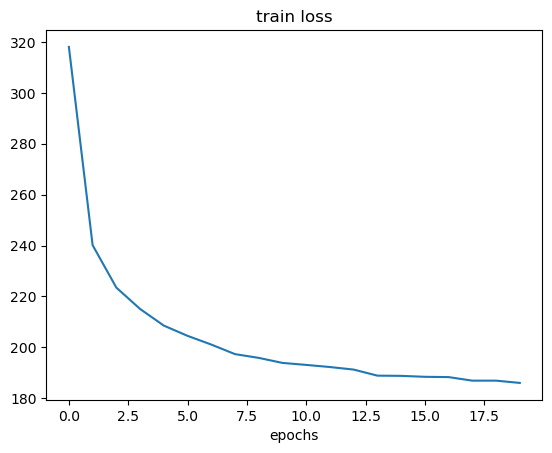

In [58]:
plt.plot(train_losses)
plt.xlabel('epochs')
plt.title('train loss')
plt.show()

In [11]:
model = Encoder(output_dim=2).cuda()
model.load_state_dict(torch.load('encoder_weights.pt'))

<All keys matched successfully>

In [12]:
from torch.utils.data import DataLoader, TensorDataset

test_loader = DataLoader(TensorDataset(torch.Tensor(X), torch.Tensor(X)), batch_size=1024, shuffle=False)

outputs = []
with torch.no_grad():
    for batch_x, batch_y in test_loader:
        output = model(batch_x.cuda()).detach().cpu().numpy()
        outputs.append(output)

outputs = np.concatenate(outputs, axis=0)
outputs.shape

(70000, 2)

In [14]:
def normalise(z):
    """normalise coordinates to 0~1

    :param z: normalised coordinates
    """
    if type(z) == type(torch.ones(1)):
        z0 = (z[:,0] - torch.min(z[:,0])) / (torch.max(z[:,0]) - torch.min(z[:,0]))
        z1 = (z[:,1] - torch.min(z[:,1])) / (torch.max(z[:,1]) - torch.min(z[:,1]))
        z = torch.vstack([z0.reshape(-1,1), z1.reshape(-1,1)])
    
    if type(z) == type(np.ones(1)):
        z0 = (z[:,0] - np.min(z[:,0])) / (np.max(z[:,0]) - np.min(z[:,0]))
        z1 = (z[:,1] - np.min(z[:,1])) / (np.max(z[:,1]) - np.min(z[:,1]))
        z = np.hstack([z0.reshape(-1,1), z1.reshape(-1,1)])

    return z

outputs_normalised = normalise(outputs)
outputs_normalised.shape

(70000, 2)

In [20]:
np.save("./umap_data_reducted.npy", np.hstack([normalise(outputs), np.array(y).reshape(-1,1)]))

d:\anaconda3\envs\torch\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 9600x7200 with 0 Axes>

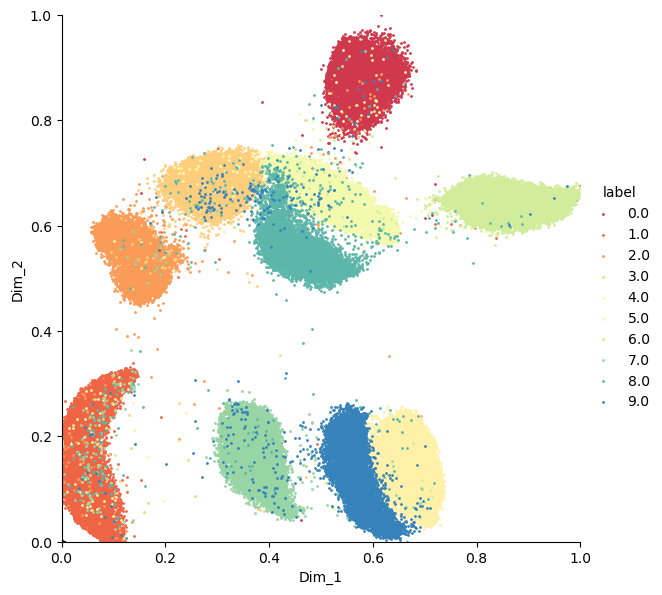

In [15]:
draw_z(z=normalise(outputs), cls=torch.tensor(y), s=1, x_highlight=0.0, y_highlight=0.0)

### DR loss + MSE Scag loss

In [56]:
# metricsmlp = ScagEstimator(size_in=1000, size_hidden=100, size_out=9).cuda()
# metricsmlp.load_state_dict(torch.load("./data/pretrain_results/MetricsMLP.pt"))
# print(sum([p.numel() for p in metricsmlp.parameters()]))
# metricsmlp.eval()

scag_module = DAB(
    approximator=ScagEstimator(size_in=batch_size, size_out=9), 
    hard_layer=ScagModule()
)
scag_module.approximator.load_state_dict(torch.load("./data/pretrain_results/MetricsMLP.pt"))

<All keys matched successfully>

d:\anaconda3\envs\torch\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 9600x7200 with 0 Axes>

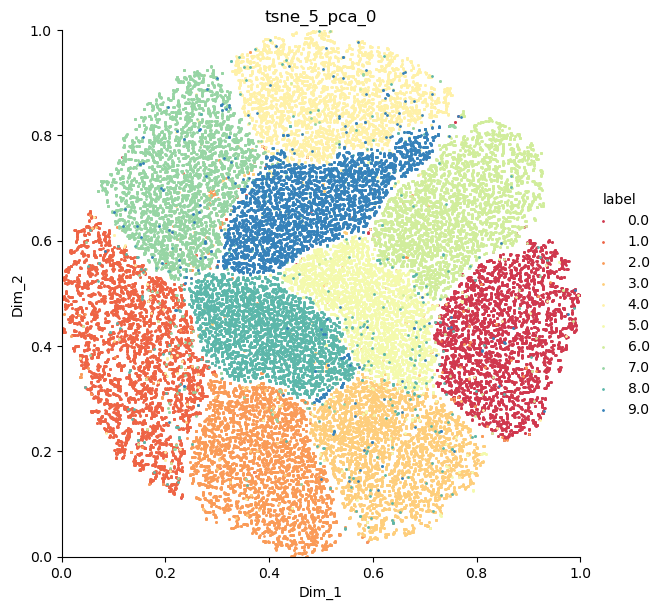

tensor([[0.0000e+00, 5.2164e-01, 2.1949e-03, 2.1290e-02, 6.6007e-03, 6.7319e-01,
         9.7099e-02, 3.5223e-01, 1.8745e-05]], device='cuda:0',
       requires_grad=True)

In [15]:
# name, z, y, scags_gt = torch.load("./data/pretrain_data_60k/12.pt")
# # print(name, z.shape, y.shape, scags.shape)
# draw_z(z=z, cls=y, s=1, title=name)

# scags_gt = scags_gt.cuda()
# scags_gt.requires_grad_()
# scags_gt

In [57]:
scags_gt = torch.tensor([
    0.10331945461918861, 
    0.8649848861743359, 
    0.0344033458, 
    0.7234166043419523, 
    0.692, 
    0.16168962959963243, 
    0.8684462756231119, 
    0.84, 
    1.1612197083386576e-7
], requires_grad=True).cuda()

In [58]:
alpha = 0.95 # 0.9
exp_name = "scags_{}".format(alpha)
epoch_num = 2

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler =torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, eta_min=1e-8)

result_dict = {
    "train_losses": [], 
    "DR_losses": [], 
    "Scag_losses": [], 
    "dab_losses": [], 

    "test_losses": [], 
    "test_DR_losses": [], 
    "test_Scag_losses": [], 
    "test_dab_losses": [], 

    "best_epoch": 0, 
    "best_test_loss": 100., 
    "best_train_loss": 100., 

    "lr": []
}

for epoch in range(epoch_num):

    print("lr: {}".format(scheduler.get_lr()[0]))
    result_dict["lr"].append(scheduler.get_lr()[0])

    # train
    train_loss = []
    DR_loss = []
    Scag_loss = []
    dab_loss = []
    for batch_to, batch_from, _, _, _, _ in tqdm(train_dataset.get_batches()):
        optimizer.zero_grad()

        embedding_to = model(batch_to)
        embedding_from = model(batch_from)
        
        try:
            scag_to = scag_module(embedding_to)
            scag_from = scag_module(embedding_from)
    
            dab_loss_i = scag_module.loss_function()
            scag_loss_to = F.mse_loss(scag_to, scags_gt)
            scag_loss_from = F.mse_loss(scag_from, scags_gt)
        except:
            dab_loss_i = torch.zeros([1]).cuda()
            scag_loss_to = torch.zeros([1]).cuda()
            scag_loss_from = torch.zeros([1]).cuda()

        # loss = criterion(embedding_to, embedding_from)
        dr_loss = criterion(embedding_to, embedding_from)
        
        loss = alpha * dr_loss + (1-alpha) * (scag_loss_to + scag_loss_from)/2 + 100 * dab_loss_i

        train_loss.append(loss.item())
        DR_loss.append(dr_loss.item())
        Scag_loss.append((scag_loss_to.item(), scag_loss_from.item()))
        dab_loss.append(dab_loss_i.item())

        loss.backward()

        optimizer.step()
        scheduler.step()

    result_dict["train_losses"].append(np.mean(train_loss))
    result_dict["DR_losses"].append(np.mean(DR_loss))
    result_dict["Scag_losses"].append((np.mean([i[0] for i in Scag_loss]), np.mean([i[1] for i in Scag_loss])))
    result_dict["dab_losses"].append(np.mean(dab_loss))

    print('epoch: {} - train, loss: {}, DR_loss: {}, Scag_loss: {}, dab_loss: {}'.format( \
        epoch, result_dict["train_losses"][-1], result_dict["DR_losses"][-1], \
        result_dict["Scag_losses"][-1], result_dict["dab_losses"][-1]))


    # # test
    # test_loss = []
    # test_DR_loss = []
    # test_Scag_loss = []
    # test_dab_loss = []

    # model.eval()

    # for batch_to, batch_from, _, _, _, _ in tqdm(test_dataset.get_batches()):
    #     embedding_to = model(batch_to)
    #     embedding_from = model(batch_from)
        
    #     try:
    #         scag_to = scag_module(embedding_to)
    #         scag_from = scag_module(embedding_from)
    
    #         dab_loss_i = scag_module.loss_function()

    #         scag_loss_to = F.mse_loss(scag_to, scags_gt)
    #         scag_loss_from = F.mse_loss(scag_from, scags_gt)
    #     except:
    #         dab_loss_i = torch.zeros([1]).cuda()
    #         scag_loss_to = torch.zeros([1]).cuda()
    #         scag_loss_from = torch.zeros([1]).cuda()

    #     dr_loss = criterion(embedding_to, embedding_from)
        

    #     loss = alpha * dr_loss + (1-alpha) * (scag_loss_to + scag_loss_from)/2 + 10 * dab_loss_i

    #     test_loss.append(loss.item())
    #     test_DR_loss.append(dr_loss.item())
    #     test_Scag_loss.append((scag_loss_to.item(), scag_loss_from.item()))
    #     test_dab_loss.append(dab_loss_i.item())

    # result_dict["test_losses"].append(np.mean(test_loss))
    # result_dict["test_DR_losses"].append(np.mean(test_DR_loss))
    # result_dict["test_Scag_losses"].append((np.mean([i[0] for i in test_Scag_loss]), np.mean([i[1] for i in test_Scag_loss])))
    # result_dict["test_dab_losses"].append(np.mean(test_dab_loss))

    # print('epoch: {} - test, loss: {}, DR_loss: {}, Scag_loss: {}, dab_loss: {}'.format( \
    #     epoch, result_dict["test_losses"][-1], result_dict["test_DR_losses"][-1], \
    #     result_dict["test_Scag_losses"][-1], result_dict["test_dab_losses"][-1]))

    # if result_dict["test_losses"][-1] < result_dict["best_test_loss"]:
    #     torch.save(model.state_dict(), "./data/pretrain_results/DR/DR_weights_{}.pt".format(exp_name))
    #     result_dict["best_epoch"] = epoch
    #     result_dict["best_test_loss"] = result_dict["test_losses"][-1]
    #     result_dict["best_train_loss"] = result_dict["train_losses"][-1]

    model.train()

d:\anaconda3\envs\torch\lib\site-packages\torch\optim\lr_scheduler.py:1379: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  warnings.warn("To get the last learning rate computed by the scheduler, "


lr: 0.0001


12it [00:01,  7.89it/s]C:\Users\wanzh\AppData\Local\Temp\ipykernel_20064\1888082203.py:47: UserWarning: Using a target size (torch.Size([9])) that is different to the input size (torch.Size([1, 9])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  scag_loss_to = F.mse_loss(scag_to, scags_gt)
C:\Users\wanzh\AppData\Local\Temp\ipykernel_20064\1888082203.py:48: UserWarning: Using a target size (torch.Size([9])) that is different to the input size (torch.Size([1, 9])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  scag_loss_from = F.mse_loss(scag_from, scags_gt)
1448it [04:15,  5.67it/s]


epoch: 0 - train, loss: 6443901.267696712, DR_loss: 1.0052082147655073, Scag_loss: (0.060951389552438784, 0.06101726812120136), dab_loss: 64439.00302308407
lr: 9.55819536622451e-06


1448it [02:59,  8.07it/s]

epoch: 1 - train, loss: 1.1029048877773364, DR_loss: 1.1609525296898837, Scag_loss: (0.0, 0.0), dab_loss: 0.0


In [17]:
# result_dict["best_epoch"], result_dict["best_test_loss"], result_dict["best_train_loss"]

(5, 57.31176536751592, 64.30997902216625)

In [18]:
# plt.plot(result_dict["DR_losses"])
# plt.plot(result_dict["test_DR_losses"])
# plt.plot(result_dict["Scag_losses"])
# plt.plot(result_dict["test_Scag_losses"])
# plt.legend(["train DR", "test DR", "train scag", "test scag"])
# plt.title("loss")
# plt.show()

In [19]:
# model.load_state_dict(torch.load("./data/pretrain_results/DR/DR_weights_scags_0.95.pt"))

<All keys matched successfully>

In [59]:
# train dataset
train_loader = DataLoader(TensorDataset(torch.Tensor(X_train), torch.Tensor(X_train)), batch_size=10000, shuffle=False)

# predict & visualise training set
outputs = []
# out_scags = []
model.eval()
with torch.no_grad():
    for batch_x, batch_y in tqdm(train_loader):
        output = model(batch_x.cuda()).detach().cpu().numpy()
        # out_scags.append(torch.tensor([i for i in scagnostics.compute(x=output[:,0], y=output[:,1]).values()]))
        outputs.append(output)

# for i in range(len(out_scags)):
#     print(out_scags[i])
outputs = np.concatenate(outputs, axis=0)
outputs.shape

100%|██████████| 6/6 [00:01<00:00,  4.78it/s]


(60000, 2)

In [ ]:
scagnostics.compute(outputs[:, 0], outputs[:, 1])

In [28]:
torch.set_printoptions(precision=4, sci_mode=False)

torch.tensor([i for i in scagnostics.compute(outputs[:, 0], outputs[:, 1]).values()])

tensor([0.0059, 0.5574, 0.0101, 0.0212, 0.0142, 0.6243, 0.3154, 0.3282, 0.0050])

In [60]:
scags_gt.view(-1)

tensor([1.0332e-01, 8.6498e-01, 3.4403e-02, 7.2342e-01, 6.9200e-01, 1.6169e-01,
        8.6845e-01, 8.4000e-01, 1.1612e-07], device='cuda:0',
       grad_fn=<ViewBackward0>)

In [22]:
torch.set_printoptions(precision=None, sci_mode=True)

In [62]:
ld = torch.hstack([torch.from_numpy(normalise(outputs)), y_train.view(-1,1)])
ld.shape, ld[:5]

(torch.Size([60000, 3]),
 tensor([[0.0000, 0.3547, 5.0000],
         [0.0000, 0.3791, 0.0000],
         [0.0000, 0.2539, 4.0000],
         [0.0000, 0.5009, 1.0000],
         [0.0000, 0.4309, 9.0000]]))

In [63]:
for i in range(10):
    ld_df = pd.DataFrame(ld)
    ld_df_i = ld_df[ld_df.iloc[:,2]==i].iloc[:, 1]
    print("number: {}".format(i))
    print("mean: {:6f}, std: {:6f}".format(ld_df_i.mean(), ld_df_i.std()))
    print("min: {:6f}, 25%: {:6f}, 50%: {:6f}, 75%: {:6f}, max: {:6f}".format(ld_df_i.min(), ld_df_i.quantile(0.25), ld_df_i.quantile(0.5), ld_df_i.quantile(0.75), ld_df_i.max()))
    print()

number: 0
mean: 0.445651, std: 0.083552
min: 0.082626, 25%: 0.391274, 50%: 0.447829, 75%: 0.501989, max: 1.000000

number: 1
mean: 0.481397, std: 0.035252
min: 0.257071, 25%: 0.462005, 50%: 0.482154, 75%: 0.502022, max: 0.834400

number: 2
mean: 0.402106, std: 0.069399
min: 0.055015, 25%: 0.358757, 50%: 0.403634, 75%: 0.447366, max: 0.883512

number: 3
mean: 0.391287, std: 0.071876
min: 0.078681, 25%: 0.347837, 50%: 0.393958, 75%: 0.437918, max: 0.906729

number: 4
mean: 0.414923, std: 0.060245
min: 0.159397, 25%: 0.379358, 50%: 0.416490, 75%: 0.452874, max: 0.998730

number: 5
mean: 0.402267, std: 0.070381
min: 0.000000, 25%: 0.361467, 50%: 0.406484, 75%: 0.448219, max: 0.817321

number: 6
mean: 0.457528, std: 0.071428
min: 0.122821, 25%: 0.415470, 50%: 0.463187, 75%: 0.504525, max: 0.907677

number: 7
mean: 0.459180, std: 0.057576
min: 0.192552, 25%: 0.424192, 50%: 0.460664, 75%: 0.495405, max: 0.908221

number: 8
mean: 0.390123, std: 0.071614
min: 0.062379, 25%: 0.345981, 50%: 0.392

In [61]:
draw_z(
    z=normalise(outputs), 
    cls=y_train, 
    s=1, 
    save_path="./DR_Scags_skinny.png", 
    display=True, 
    title="DR_loss + Scag_loss + 10*DAB_loss"
)

d:\anaconda3\envs\torch\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 9600x7200 with 0 Axes>

In [40]:
draw_z(
    z=normalise(outputs), 
    cls=y_train, 
    s=1, 
    save_path="./DR_Scags_z.png", 
    display=True
)

d:\anaconda3\envs\torch\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 9600x7200 with 0 Axes>